# Introduction

### Problem Statement

The primary objective of this case study is to understand the factors that influence loan default in a consumer finance company specializing in lending various types of loans to urban customers. The aim is to identify patterns that indicate if a person is likely to default on their loan, which can help the company make informed decisions to minimize financial losses. Specifically, the company wants to distinguish between borrowers who are likely to repay the loan and those who are at risk of defaulting (labeled as 'charged-off').

#### Analysis Approach

1. **Data Collection, Cleaning and Preprocessing**:
    - Load and explore the dataset to understand its structure and content.
    - Clean the data by handling missing values, correcting data types, and dealing with high cardinality columns.
    - Exclude irrelevant columns such as `zip_code`, `emp_title`, and `title` to streamline the analysis.

2. **Univariate Analysis**:
    - Perform univariate analysis on numerical columns to understand their distributions and identify any outliers.
    - Perform univariate analysis on categorical columns to explore the frequency distributions of different categories.

3. **Outlier Detection and Handling**:
    - Identify outliers in key numerical columns and determine their impact on the analysis.
    - Apply appropriate techniques to handle outliers, such as transformation, capping, or removal.

4. **Bivariate Analysis**:
    - Analyze relationships between pairs of variables to identify patterns and correlations.
    - Use scatter plots, correlation matrices, and other visualization techniques to illustrate these relationships.

5. **Feature Engineering**:
    - Create new features based on existing data to enhance the predictive power of the analysis.
    - Consider binning continuous variables, creating interaction terms, and other transformations.

6. **ARE WE DOING THIS** **Modeling and Prediction (if applicable)**:
    - Develop predictive models to classify loan applicants as likely to default or not.
    - Evaluate model performance using appropriate metrics and validation techniques.

7. **Insights and Recommendations**:
    - Summarize key insights from the univariate and bivariate analysis.
    - Provide actionable recommendations to the company based on the findings.
    - Present the overall approach, analysis results, and recommendations in a clear and concise manner.

This approach ensures a thorough examination of the dataset to uncover meaningful patterns and relationships that can help the company minimize credit losses by identifying risky loan applicants. The analysis will be documented in a well-commented Python notebook and summarized in a presentation with relevant visualizations.

# Import required libraries and set styles.

In [2]:
# %pip install tabulate, plotly-express
# %pip install --upgrade nbformat

In [3]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.cluster.hierarchy import linkage, dendrogram
from tabulate import tabulate
import plotly.express as px

# Set plot style
# Print available style and use as required 
# print(plt.style.available)
plt.style.use('seaborn-v0_8-darkgrid')

# Display settings
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 100)

# Load orginal CSV data.

In [4]:
loan_data = pd.read_csv('data/loan.csv', na_values=['NA'])
loan_data.to_pickle('data/data_original.pkl')

print("Loan Dataset:")
display(loan_data.head())

C:\Users\amit.mohite\AppData\Local\Temp\ipykernel_11216\2844185999.py:1: DtypeWarning: Columns (47) have mixed types. Specify dtype option on import or set low_memory=False.
  loan_data = pd.read_csv('data/loan.csv', na_values=['NA'])


Loan Dataset:


,id,member_id,loan_amnt,funded_amnt,funded_amnt_inv,term,int_rate,installment,grade,sub_grade,emp_title,emp_length,home_ownership,annual_inc,verification_status,issue_d,loan_status,pymnt_plan,url,desc,purpose,title,zip_code,addr_state,dti,delinq_2yrs,earliest_cr_line,inq_last_6mths,mths_since_last_delinq,mths_since_last_record,open_acc,pub_rec,revol_bal,revol_util,total_acc,initial_list_status,out_prncp,out_prncp_inv,total_pymnt,total_pymnt_inv,total_rec_prncp,total_rec_int,total_rec_late_fee,recoveries,collection_recovery_fee,last_pymnt_d,last_pymnt_amnt,next_pymnt_d,last_credit_pull_d,collections_12_mths_ex_med,mths_since_last_major_derog,policy_code,application_type,annual_inc_joint,dti_joint,verification_status_joint,acc_now_delinq,tot_coll_amt,tot_cur_bal,open_acc_6m,open_il_6m,open_il_12m,open_il_24m,mths_since_rcnt_il,total_bal_il,il_util,open_rv_12m,open_rv_24m,max_bal_bc,all_util,total_rev_hi_lim,inq_fi,total_cu_tl,inq_last_12m,acc_open_past_24mths,avg_cur_bal,bc_open_to_buy,bc_util,chargeoff_within_12_mths,delinq_amnt,mo_sin_old_il_acct,mo_sin_old_rev_tl_op,mo_sin_rcnt_rev_tl_op,mo_sin_rcnt_tl,mort_acc,mths_since_recent_bc,mths_since_recent_bc_dlq,mths_since_recent_inq,mths_since_recent_revol_delinq,num_accts_ever_120_pd,num_actv_bc_tl,num_actv_rev_tl,num_bc_sats,num_bc_tl,num_il_tl,num_op_rev_tl,num_rev_accts,num_rev_tl_bal_gt_0,num_sats,num_tl_120dpd_2m,num_tl_30dpd,num_tl_90g_dpd_24m,num_tl_op_past_12m,pct_tl_nvr_dlq,percent_bc_gt_75,pub_rec_bankruptcies,tax_liens,tot_hi_cred_lim,total_bal_ex_mort,total_bc_limit,total_il_high_credit_limit
0,1077501,1296599,5000,5000,4975.0,36 months,10.65%,162.87,B,B2,NaN,10+ years,RENT,24000.0,Verified,Dec-11,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/22/11 > I need to upgra...,credit_card,Computer,860xx,AZ,27.65,0,Jan-85,1,NaN,NaN,3,0,13648,83.70%,9,f,0.00,0.00,5863.155187,5833.84,5000.00,863.16,0.00,0.00,0.00,Jan-15,171.62,NaN,May-16,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
1,1077430,1314167,2500,2500,2500.0,60 months,15.27%,59.83,C,C4,Ryder,< 1 year,RENT,30000.0,Source Verified,Dec-11,Charged Off,n,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/22/11 > I plan to use t...,car,bike,309xx,GA,1.00,0,Apr-99,5,NaN,NaN,3,0,1687,9.40%,4,f,0.00,0.00,1008.710000,1008.71,456.46,435.17,0.00,117.08,1.11,Apr-13,119.66,NaN,Sep-13,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
2,1077175,1313524,2400,2400,2400.0,36 months,15.96%,84.33,C,C5,NaN,10+ years,RENT,12252.0,Not Verified,Dec-11,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,NaN,small_business,real estate business,606xx,IL,8.72,0,Nov-01,2,NaN,NaN,2,0,2956,98.50%,10,f,0.00,0.00,3005.666844,3005.67,2400.00,605.67,0.00,0.00,0.00,Jun-14,649.91,NaN,May-16,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN,NaN,NaN
3,1076863,1277178,10000,10000,10000.0,36 months,13.49%,339.31,C,C1,AIR RESOURCES BOARD,10+ years,RENT,49200.0,Source Verified,Dec-11,Fully Paid,n,https://lendingclub.com/browse/loanDetail.acti...,Borrower added on 12/21/11 > to pay for prop...,other,personel,917xx,CA,20.00,0,Feb-96,1,35.0,NaN,10,0,5598,21%,37,f,0.00,0.00,12231.890000,12231.89,10000.00,2214.92,16.97,0.00,0.00,Jan-15,357.48,NaN,Apr-16,0.0,NaN,1,INDIVIDUAL,NaN,NaN,NaN,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN

# Data cleaning

### Descriptive statistics and data frame shortening 

In [5]:
# All columns in dataframe
all = loan_data.columns

# Empty columns
columns_with_missings = loan_data.isnull().mean() * 100
columns_with_missings = columns_with_missings[columns_with_missings > 10]

# Columns with only one unique value
single_value_columns = one_unique_value_columns = [column for column in loan_data.columns if loan_data[column].nunique() == 1]

# Columns like ID
columns_like_id = one_unique_value_columns = [column for column in loan_data.columns if loan_data[column].nunique() == len(loan_data)]

# Columns of interest
required_columns = [v for v in all if not (v in columns_with_missings or v in single_value_columns or v in columns_like_id)]

# Descriptive statistics for numeric columns
num_desc = loan_data[required_columns].describe()

# descriptive statistics for categorical columns
cat_desc = loan_data[required_columns].describe(include=['object', 'category'])

# Saving details to in an Excel
with pd.ExcelWriter('descriptive_statistics.xlsx') as writer:
    num_desc.to_excel(writer, sheet_name='Numeric')
    cat_desc.to_excel(writer, sheet_name='Categorical')
    pd.DataFrame(columns_with_missings, columns=['blank_columns']).to_excel(writer, sheet_name='columns_with_missings')
    pd.DataFrame(single_value_columns, columns=['single_value_columns']).to_excel(writer, sheet_name='single_value_columns')
    pd.DataFrame(columns_like_id, columns=['columns_like_id']).to_excel(writer, sheet_name='columns_like_id')
    pd.DataFrame(all, columns=['all']).to_excel(writer, sheet_name='all')

loan_data = loan_data[required_columns]
loan_data.to_pickle('data\loan_data_required_columns.pkl')
loan_data.shape

(39717, 41)

### Unique values -  details of unique values in each column

In [6]:
unique_values = {}
# Iterate through each column and get the unique values
for column in loan_data.columns:
    unique_values[column] = sorted(loan_data[column].astype(str).unique())

# Write the unique values DataFrame to an Excel file
d = pd.DataFrame(dict([(k, pd.Series(v)) for k, v in unique_values.items()]))
d.to_excel('unique_values.xlsx', index=False)

### Post review of `unique_values.xlsx` and `Data_Dictionary.xlsx`, we have decided to drop following columns

- `emp_title`
- `title`
- `zip_code`

In [7]:
loan_data = loan_data.drop(columns=['emp_title', 'title', 'zip_code'])

### Post review of `Data_Dictionary.xlsx` we have concluded some data is available before loan is approved and some data is collected after loan is disbured


#### Pre-loan - Data know before approving loan

| Column Name       | Description                                                   |
|-------------------|---------------------------------------------------------------|
| addr_state        | The state provided by the borrower in the loan application.   |
| annual_inc        | The self-reported annual income provided by the borrower.     |
| delinq_2yrs       | The number of 30+ days past-due incidences of delinquency.    |
| dti               | A ratio calculated using the borrower’s total monthly debt.   |
| earliest_cr_line  | The month the borrower's earliest reported credit line.       |
| emp_length        | Employment length in years.                                   |
| funded_amnt       | The total amount committed to that loan at that point in time.|
| funded_amnt_inv   | The total amount funded by investors for that loan.           |
| grade             | LC assigned loan grade.                                       |
| home_ownership    | The home ownership status provided by the borrower.           |
| installment       | The monthly payment owed by the borrower.                     |
| int_rate          | Interest rate on the loan.                                    |
| issue_d           | The month which the loan was funded.                          |
| loan_amnt         | The listed amount of the loan applied for by the borrower.    |
| open_acc          | The number of open credit lines in the borrower's credit file.|
| pub_rec_bankruptcies | Number of public record bankruptcies.                       |
| purpose           | A category provided by the borrower for the loan request.     |
| revol_bal         | Total credit revolving balance.                               |
| revol_util        | Revolving line utilization rate.                              |
| sub_grade         | LC assigned loan subgrade.                                    |
| term              | The number of payments on the loan.                           |
| total_acc         | The total number of credit lines currently in the borrower’s credit file. |
| verification_status | Indicates if income was verified by LC.                      |


#### Post-loan - Data know after loan is disbursed

| Column Name              | Description                                                   |
|--------------------------|---------------------------------------------------------------|
| collection_recovery_fee  | Post charge off collection fee.                               |
| inq_last_6mths           | The number of inquiries in the past 6 months.                 |
| last_credit_pull_d       | The most recent month LC pulled credit for this loan.         |
| last_pymnt_amnt          | Last total payment amount received.                           |
| last_pymnt_d             | Last month payment was received.                              |
| loan_status              | Current status of the loan.                                   |
| out_prncp                | Remaining outstanding principal for total amount funded.      |
| out_prncp_inv            | Remaining outstanding principal for portion of total amount funded by investors. |
| pub_rec                  | Number of derogatory public records.                          |
| recoveries               | Post charge off gross recovery.                               |
| total_pymnt              | Payments received to date for total amount funded.            |
| total_pymnt_inv          | Payments received to date for portion of total amount funded by investors. |
| total_rec_int            | Interest received to date.                                    |
| total_rec_late_fee       | Late fees received to date.                                   |
| total_rec_prncp          | Principal received to date.                                   |


### Fix data type

In [8]:
loan_data.dtypes

loan_amnt                    int64
funded_amnt                  int64
funded_amnt_inv            float64
term                        object
int_rate                    object
installment                float64
grade                       object
sub_grade                   object
emp_length                  object
home_ownership              object
annual_inc                 float64
verification_status         object
issue_d                     object
loan_status                 object
purpose                     object
addr_state                  object
dti                        float64
delinq_2yrs                  int64
earliest_cr_line            object
inq_last_6mths               int64
open_acc                     int64
pub_rec                      int64
revol_bal                    int64
revol_util                  object
total_acc                    int64
out_prncp                  float64
out_prncp_inv              float64
total_pymnt                float64
total_pymnt_inv     

Comparing against `unique_values.xlsx` following changes are required to dataframe. 

**NOTE : we are forcing many columns to integer by rounding the data**. This is done simplify further steps and truncation should not cause impact on analysis. Also in many cases decimal data is insignifcant. For example `dti` of 0.01 or `last_pymnt_amnt` of 1.82



| Column Name                | Data Type Change                                    |
|----------------------------|-----------------------------------------------------|
| funded_amnt_inv            | int64                                               |
| term                       | categorical ordered                                 |
| int_rate                   | float64 - remove % sign                             |
| installment                | int64                                               |
| grade                      | categorical ordered                                 |
| sub_grade                  | categorical ordered                                 |
| emp_length                 | categorical ordered                                 |
| home_ownership             | categorical ordered                                 |
| annual_inc                 | int64                                               |
| verification_status        | categorical                                         |
| issue_d                    | date - current data is in format: dd-yy             |
| loan_status                | categorical ordered                                 |
| purpose                    | categorical                                         |
| addr_state                 | objectcategorical                                   |
| dti                        | int64                                               |
| delinq_2yrs                | int64                                               |
| earliest_cr_line           | date - current data is in format: dd-yy             |
| inq_last_6mths             | int64                                               |
| open_acc                   | int64                                               |
| pub_rec                    | int64                                               |
| revol_bal                  | int64                                               |
| revol_util                 | int64 - remove % sign                               |
| total_acc                  | int64                                               |
| out_prncp                  | int64                                               |
| out_prncp_inv              | int64                                               |
| total_pymnt                | int64                                               |
| total_pymnt_inv            | int64                                               |
| total_rec_prncp            | int64                                               |
| total_rec_int              | int64                                               |
| total_rec_late_fee         | int64                                               |
| recoveries                 | int64                                               |
| collection_recovery_fee    | int64                                               |
| last_pymnt_d               | date - current data is in format: dd-yy             |
| last_pymnt_amnt            | int64                                               |
| last_credit_pull_d         | date - current data is in format: dd-yy             |
| pub_rec_bankruptcies       | Categorical                                               |

In [9]:
loan_data['loan_amnt'] = loan_data['loan_amnt'].astype(float).round().astype('Int64')
loan_data['funded_amnt'] = loan_data['funded_amnt'].astype(float).round().astype('Int64')
loan_data['funded_amnt_inv'] = loan_data['funded_amnt_inv'].astype(float).round().astype('Int64')
loan_data['term'] = pd.Categorical(loan_data['term'].str.strip(), categories=['36 months', '60 months'], ordered=True) # Both `36 months` and `60 months` had space and it had to be stripped
loan_data['int_rate'] = loan_data['int_rate'].str.rstrip('%').astype(float)
loan_data['installment'] = loan_data['installment'].astype(float).round().astype('Int64')
loan_data['grade'] = pd.Categorical(loan_data['grade'], categories=['A', 'B', 'C', 'D', 'E', 'F', 'G'], ordered=True)
loan_data['sub_grade'] = pd.Categorical(loan_data['sub_grade'], categories=['A1','A2','A3','A4','A5',
                                                                                        'B1','B2','B3','B4','B5',
                                                                                        'C1','C2','C3','C4','C5',
                                                                                        'D1','D2','D3','D4','D5',
                                                                                        'E1','E2','E3','E4','E5',
                                                                                        'F1','F2','F3','F4','F5',
                                                                                        'G1','G2','G3','G4','G5'], ordered=True)

loan_data['emp_length'] = pd.Categorical(loan_data['emp_length'], categories= ['< 1 year', '1 year', '2 years', '3 years', 
                                                                                           '4 years', '5 years', '6 years', 
                                                                                           '7 years', '8 years', '9 years', 
                                                                                           '10+ years'], ordered=True)

loan_data['home_ownership'] = pd.Categorical(loan_data['home_ownership'], categories=['NONE', 'OTHER', 'RENT', 'MORTGAGE', 'OWN'], ordered=True)

loan_data['annual_inc'] = loan_data['annual_inc'].astype(float).round().astype('Int64')
loan_data['verification_status'] = pd.Categorical(loan_data['verification_status'], categories=['Not Verified', 'Source Verified', 'Verified'], ordered=True)
loan_data['issue_d'] = pd.to_datetime(loan_data['issue_d'], format='%b-%y')
loan_data['loan_status'] = pd.Categorical(loan_data['loan_status'], categories=['Charged Off', 'Current', 'Fully Paid'], ordered=True)
loan_data['purpose'] = loan_data['purpose'].astype('category')
loan_data['addr_state'] = loan_data['addr_state'].astype('category')
loan_data['dti'] = loan_data['dti'].astype(float).round().astype('Int64')
loan_data['delinq_2yrs'] = loan_data['delinq_2yrs'].astype('Int64')
loan_data['inq_last_6mths'] = loan_data['inq_last_6mths'].astype('Int64')
loan_data['open_acc'] = loan_data['open_acc'].astype('Int64')
loan_data['pub_rec'] = loan_data['pub_rec'].astype('Int64')
loan_data['revol_bal'] = loan_data['revol_bal'].astype('Int64')
loan_data['revol_util'] = loan_data['revol_util'].str.rstrip('%').astype(float).round().astype('Int64')
loan_data['total_acc'] = loan_data['total_acc'].astype('Int64')
loan_data['out_prncp'] = loan_data['out_prncp'].astype(float).round().astype('Int64')
loan_data['out_prncp_inv'] = loan_data['out_prncp_inv'].astype(float).round().astype('Int64')
loan_data['total_pymnt'] = loan_data['total_pymnt'].astype(float).round().astype('Int64')
loan_data['total_pymnt_inv'] = loan_data['total_pymnt_inv'].astype(float).round().astype('Int64')
loan_data['total_rec_prncp'] = loan_data['total_rec_prncp'].astype(float).round().astype('Int64')
loan_data['total_rec_int'] = loan_data['total_rec_int'].astype(float).round().astype('Int64')
loan_data['total_rec_late_fee'] = loan_data['total_rec_late_fee'].astype(float).round().astype('Int64')
loan_data['recoveries'] = loan_data['recoveries'].astype(float).round().astype('Int64')
loan_data['collection_recovery_fee'] = loan_data['collection_recovery_fee'].astype(float).round().astype('Int64')
loan_data['last_pymnt_d'] = pd.to_datetime(loan_data['last_pymnt_d'], format='%b-%y')
loan_data['last_pymnt_amnt'] = loan_data['last_pymnt_amnt'].astype(float).round().astype('Int64')
loan_data['last_credit_pull_d'] = pd.to_datetime(loan_data['last_credit_pull_d'], format='%b-%y')
loan_data['pub_rec_bankruptcies'] = loan_data['pub_rec_bankruptcies'].astype('Int64')

# We found special case for earliest_cr_line. Data starts at 1945 and goes up to 2008.
def adjust_year(date_str):
    date = pd.to_datetime(date_str, format='%b-%y')
    if date.year > 2008:
        date = date.replace(year=date.year - 100)
    return date
loan_data['earliest_cr_line'] = loan_data['earliest_cr_line'].apply(adjust_year)

In [10]:
loan_data.to_pickle('data\loan_data_with_fixed_dtype.pkl')

### New Features and Encoding 

#### Loan issue date to loan issue month and year

In [11]:
loan_data['issue_d_month'] = pd.to_datetime(loan_data['issue_d']).dt.month.astype('Int64')
loan_data['issue_d_year'] = pd.to_datetime(loan_data['issue_d']).dt.year.astype('Int64')
loan_data[['issue_d', 'issue_d_month', 'issue_d_year']].head()

,issue_d,issue_d_month,issue_d_year
0,2011-12-01,12,2011
1,2011-12-01,12,2011
2,2011-12-01,12,2011
3,2011-12-01,12,2011
4,2011-12-01,12,2011


#### Calculate credit history age

In [12]:
# We have few members with credit history dating back to year 46, assuming it is 1946.

loan_data['credit_history_age_years'] = (pd.to_datetime(loan_data['issue_d']) - pd.to_datetime(loan_data['earliest_cr_line'])).dt.days
loan_data['credit_history_age_years'] = loan_data['credit_history_age_years'] / 365
loan_data['credit_history_age_years'] = loan_data['credit_history_age_years'].round(0).astype('Int64')
loan_data[['issue_d', 'earliest_cr_line', 'credit_history_age_years']].head()

,issue_d,earliest_cr_line,credit_history_age_years
0,2011-12-01,1985-01-01,27
1,2011-12-01,1999-04-01,13
2,2011-12-01,2001-11-01,10
3,2011-12-01,1996-02-01,16
4,2011-12-01,1996-01-01,16


Create categorical variable for bankruptcy

In [13]:
loan_data['bankruptcy_category'] = loan_data['pub_rec_bankruptcies'].map({0: 'Not reported', 1: 'Reported', 2: 'Reported'})
loan_data['bankruptcy_category'] = loan_data['bankruptcy_category'].astype('category')
loan_data['bankruptcy_category'] = loan_data['bankruptcy_category'].where(~loan_data['pub_rec_bankruptcies'].isna(), other=pd.NA)

#### Create income bands.

Reference - https://www.statista.com/statistics/203183/percentage-distribution-of-household-income-in-the-us/

In [14]:
# Define the bins and labels based on the reference
bins = [-1, 15000, 25000, 35000, 50000, 75000, 100000, 150000, 200000, float('inf')]
labels = [
    'Under 15,000',
    '15,000 to 24,999',
    '25,000 to 34,999',
    '35,000 to 49,999',
    '50,000 to 74,999',
    '75,000 to 99,999',
    '100,000 to 149,999',
    '150,000 to 199,999',
    '200,000 and over'
]

# Create the income_band column
loan_data['income_band'] = pd.cut(loan_data['annual_inc'], bins=bins, labels=labels)

# Display the new column to verify
loan_data[['annual_inc', 'income_band']].head()


,annual_inc,income_band
0,24000,"15,000 to 24,999"
1,30000,"25,000 to 34,999"
2,12252,"Under 15,000"
3,49200,"35,000 to 49,999"
4,80000,"75,000 to 99,999"


#### Monthly Installment to Income Ratio


In [15]:
loan_data['installment_to_income_ratio'] = loan_data['installment'] / (loan_data['annual_inc'] / 12) * 100
loan_data['installment_to_income_ratio'] = loan_data['installment_to_income_ratio'].round(0).astype('Int64')
loan_data[['installment_to_income_ratio', 'installment', 'annual_inc']].head()

,installment_to_income_ratio,installment,annual_inc
0,8,163,24000
1,2,60,30000
2,8,84,12252
3,8,339,49200
4,1,68,80000


#### Interest rate level

In [16]:
loan_data['interest_rate_level'] = pd.cut(loan_data['int_rate'], bins=[0, 10, 15, 20, float('inf')], labels=['Low', 'Medium', 'High', 'Very High'])
loan_data[['interest_rate_level', 'int_rate']].head()

,interest_rate_level,int_rate
0,Medium,10.65
1,High,15.27
2,High,15.96
3,Medium,13.49
4,Medium,12.69


#### Investor funding ratio

In [17]:
loan_data['investor_funding_ratio'] = loan_data['funded_amnt_inv'] / loan_data['funded_amnt'] * 100
loan_data[['funded_amnt_inv', 'funded_amnt', 'investor_funding_ratio']].head()

,funded_amnt_inv,funded_amnt,investor_funding_ratio
0,4975,5000,99.5
1,2500,2500,100.0
2,2400,2400,100.0
3,10000,10000,100.0
4,3000,3000,100.0


#### Balance loan remaining

In [18]:
# Remaining Balance
loan_data['remaining_balance'] = loan_data['funded_amnt'] - loan_data['total_pymnt']
loan_data[['total_pymnt', 'funded_amnt', 'remaining_balance']].head()

,total_pymnt,funded_amnt,remaining_balance
0,5863,5000,-863
1,1009,2500,1491
2,3006,2400,-606
3,12232,10000,-2232
4,3513,3000,-513


#### Recovery amount and fee 

`recoveries` and `collection_recovery_fee` has zero for current and fully paid loans. This is confusing. Recovery does not apply to fully paid and current loans

Should we drop these columns?

In [19]:
loan_data['collection_recovery_fee'] = np.where(
    loan_data['loan_status'] != 'Charged Off',
    np.nan,
    loan_data['collection_recovery_fee']
)

loan_data['recoveries'] = np.where(
    loan_data['loan_status'] != 'Charged Off',
    np.nan,
    loan_data['recoveries']
)

print(loan_data[['loan_status', 'collection_recovery_fee', 'recoveries']].head())
print(loan_data[['loan_status', 'collection_recovery_fee', 'recoveries']].isnull().mean() * 100)

   loan_status  collection_recovery_fee  recoveries
0   Fully Paid                      NaN         NaN
1  Charged Off                      1.0       117.0
2   Fully Paid                      NaN         NaN
3   Fully Paid                      NaN         NaN
4      Current                      NaN         NaN
loan_status                 0.000000
collection_recovery_fee    85.832263
recoveries                 85.832263
dtype: float64


#### Encode categorical variables for correlations

In [20]:
from sklearn.preprocessing import OrdinalEncoder

ordered_categorical_columns = ['loan_status', 'grade', 'sub_grade', 'emp_length']

ordinal_categories = {
    'loan_status' : ['Charged Off', 'Current', 'Fully Paid'],
    'grade': ['A', 'B', 'C', 'D', 'E', 'F', 'G'],
    'sub_grade': ['A1', 'A2', 'A3', 'A4', 'A5', 'B1', 'B2', 'B3', 'B4', 'B5', 'C1', 'C2', 'C3', 'C4', 'C5', 'D1', 'D2', 'D3', 'D4', 'D5', 'E1', 'E2', 'E3', 'E4', 'E5', 'F1', 'F2', 'F3', 'F4', 'F5', 'G1', 'G2', 'G3', 'G4', 'G5'],
    'emp_length': ['< 1 year', '1 year', '2 years', '3 years', '4 years', '5 years', '6 years', '7 years', '8 years', '9 years', '10+ years'],
}

ordinal_encoder = OrdinalEncoder(categories=[ordinal_categories[col] for col in ordered_categorical_columns], handle_unknown='use_encoded_value', unknown_value=-1)

encoded_columns = ordinal_encoder.fit_transform(loan_data[ordered_categorical_columns])

encoded_df = pd.DataFrame(encoded_columns, columns=[col + '_encoded' for col in ordered_categorical_columns])
encoded_df = encoded_df + 1 # Want all codes to start from 1 instead of zero.

for c in ordered_categorical_columns:
    encoded_df[c + '_encoded'] = encoded_df[c + '_encoded'].where(~loan_data[c].isna(), other=pd.NA).astype('Int64')

loan_data = pd.concat([loan_data, encoded_df], axis=1)

loan_data['loan_risk_level'] = loan_data['purpose'].map({
    'debt_consolidation': 1,
    'credit_card': 1,
    'home_improvement': 2,
    'major_purchase': 2,
    'house': 2,
    'small_business': 3,
    'wedding': 4,
    'vacation': 4,
    'car': 5,
    'medical': 6,
    'moving': 7,
    'other': 8,
    'educational': 8,
    'renewable_energy': 8
})

loan_data[['purpose', 'loan_risk_level', 'loan_status', 'loan_status_encoded', 'grade', 'grade_encoded', 'sub_grade_encoded',  'sub_grade','emp_length', 'emp_length_encoded']].head()

,purpose,loan_risk_level,loan_status,loan_status_encoded,grade,grade_encoded,sub_grade_encoded,sub_grade,emp_length,emp_length_encoded
0,credit_card,1,Fully Paid,3,B,2,7,B2,10+ years,11
1,car,5,Charged Off,1,C,3,14,C4,< 1 year,1
2,small_business,3,Fully Paid,3,C,3,15,C5,10+ years,11
3,other,8,Fully Paid,3,C,3,11,C1,10+ years,11
4,other,8,Current,2,B,2,10,B5,1 year,2


In [ ]:
loan_data.to_pickle('data\loan_data_with_features.pkl')

# Reload data - This is starting point for data exploration

In [24]:
# Import necessary libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.cluster.hierarchy import linkage, dendrogram
from tabulate import tabulate
import plotly.express as px

plt.style.use('seaborn-v0_8-darkgrid')

# Display settings
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', 100)

# loan_data = loan_data.copy(deep=True)
loan_data = pd.read_pickle('data\loan_data_with_features.pkl')

In [25]:
pre_loan_columns = [
    'addr_state',
    'annual_inc',
    'delinq_2yrs',
    'dti',
    'earliest_cr_line',
    'emp_length',
    'funded_amnt',
    'funded_amnt_inv',
    'grade',
    'home_ownership',
    'installment',
    'int_rate',
    'issue_d',
    'loan_amnt',
    'open_acc',
    'pub_rec_bankruptcies',
    'purpose',
    'loan_risk_level',              # new featue -- TODO - need reference
    'revol_bal',
    'revol_util',
    'sub_grade',
    'term',
    'total_acc',
    'verification_status',
    'issue_d_month',                # new featue
    'issue_d_year',                 # new featue
    'credit_history_age_years',     # new featue
    'bankruptcy_category',          # new featue
    'income_band',                  # new featue
    'installment_to_income_ratio',  # new featue
    'interest_rate_level',          # new featue
    'investor_funding_ratio',       # new featue
    'grade_encoded',
    'sub_grade_encoded',
    'emp_length_encoded',
    'loan_status_encoded',
    'loan_status'
]
post_loan_columns = [
    'collection_recovery_fee',
    'inq_last_6mths',
    'last_credit_pull_d',
    'last_pymnt_amnt',
    'last_pymnt_d',
    'loan_status',
    'out_prncp',
    'out_prncp_inv',
    'pub_rec',
    'recoveries',
    'total_pymnt',
    'total_pymnt_inv',
    'total_rec_int',
    'total_rec_late_fee',
    'total_rec_prncp',
    'remaining_balance'                # new featue
]

# PRE-LOAN

We are focusing on pre-loan variables from this point in effort to find indicators which can help avoid `charged off` loans in future

In [26]:
numerical_cols = [ v for v in 
    loan_data.select_dtypes(include=['int8', 'int16', 'int32', 'int64', 'Int64', 'float16', 'float32', 'float64']).columns
    if v in pre_loan_columns
]


categorical_cols = [ v for v in 
    loan_data.select_dtypes(include=['object', 'category']).columns
    if v in pre_loan_columns
]


len(numerical_cols), len(categorical_cols)

(23, 12)

# Univariate analysis

###  Numerical data

##### Detailed descriptive stats

In [27]:
from scipy.stats import skew, kurtosis

def detailed_descriptive_stats(data, columns):
    # columns = sorted(columns)
    stats = data[columns].describe().T
    stats['missing_values'] = data[columns].isna().sum()
    stats['skew'] = data[columns].skew()
    stats['kurtosis'] = data[columns].kurtosis()
    stats['mode'] = data[columns].mode().iloc[0]
    return stats

detailed_stats = detailed_descriptive_stats(loan_data, numerical_cols)

detailed_stats.to_csv('detailed_descriptive_stats.csv')

display(detailed_stats)

,count,mean,std,min,25%,50%,75%,max,missing_values,skew,kurtosis,mode
loan_amnt,39717.0,11219.443815,7456.670694,500.0,5500.0,10000.0,15000.0,35000.0,0,1.059317,0.768669,10000.0
funded_amnt,39717.0,10947.713196,7187.23867,500.0,5400.0,9600.0,15000.0,35000.0,0,1.08171,0.937552,10000.0
funded_amnt_inv,39717.0,10397.448548,7128.451504,0.0,5000.0,8975.0,14400.0,35000.0,0,1.106213,1.062546,5000.0
int_rate,39717.0,12.021177,3.724825,5.42,9.25,11.86,14.59,24.59,0,0.293729,-0.446665,10.99
installment,39717.0,324.565929,208.871464,16.0,167.0,280.0,431.0,1305.0,0,1.128404,1.246776,156.0
annual_inc,39717.0,68968.926278,63793.765819,4000.0,40404.0,59000.0,82300.0,6000000.0,0,30.949185,2302.737774,60000.0
dti,39717.0,13.315709,6.689859,0.0,8.0,13.0,19.0,30.0,0,-0.02733,-0.847494,14.0
delinq_2yrs,39717.0,0.146512,0.491812,0.0,0.0,0.0,0.0,11.0,0,5.022035,39.4125,0.0
open_acc,39717.0,9.294408,4.400282,2.0,6.0,9.0,12.0,44.0,0,1.003762,1.677572,7.0
revol_bal,39717.0,13382.528086,15885.016641,0.0,3703.0,8850.0,17058.0,149588.0,0,3.190884,14.896523,0.0


##### Plots for Univariate analysis of Numerical variables

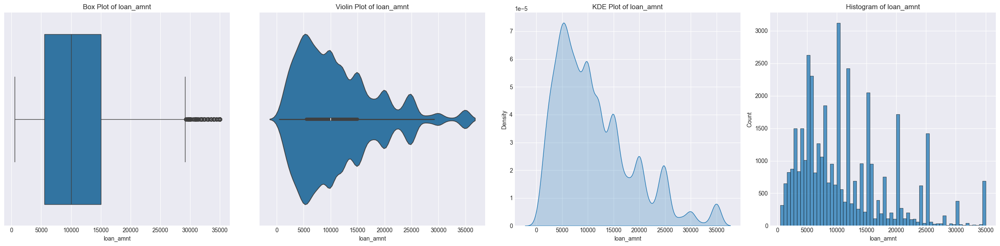

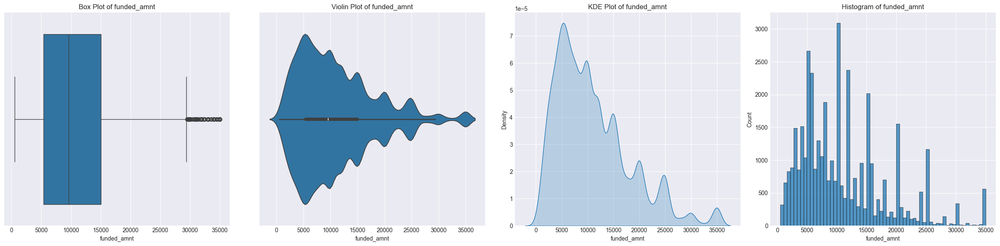

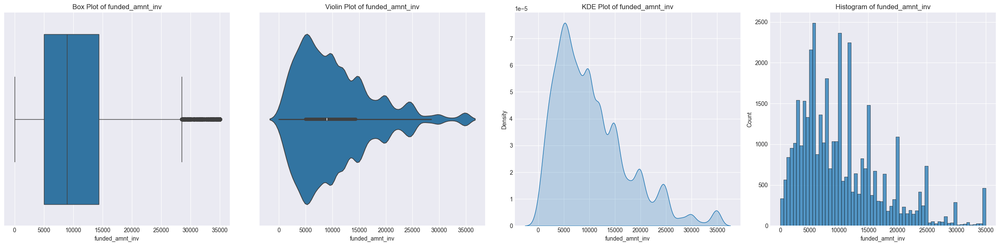

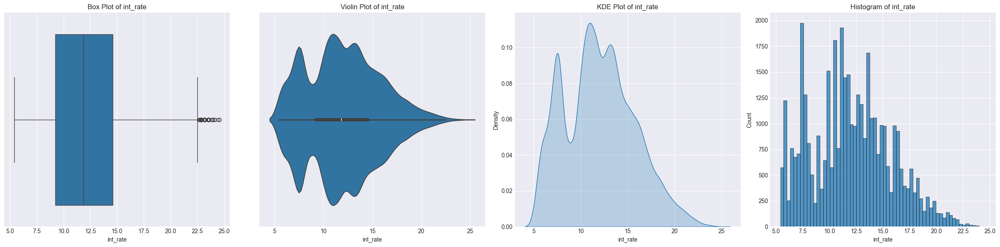

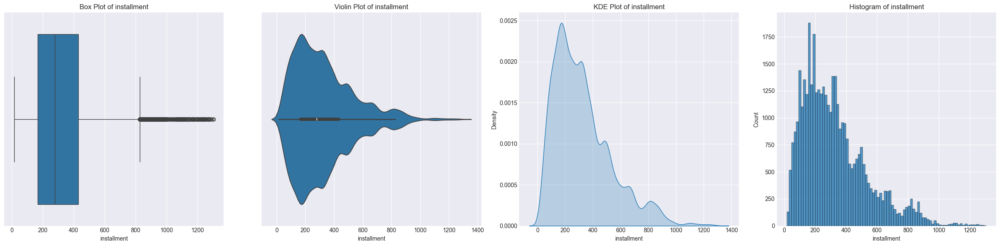

...

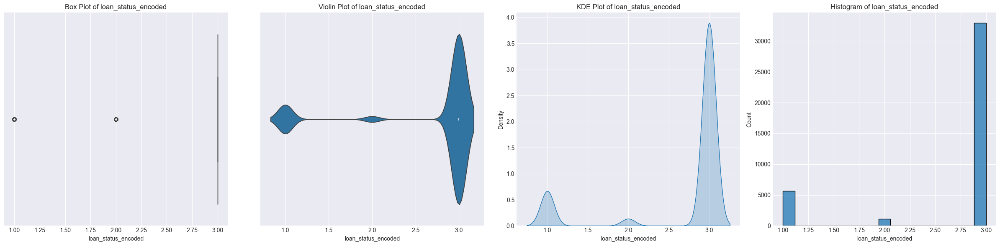

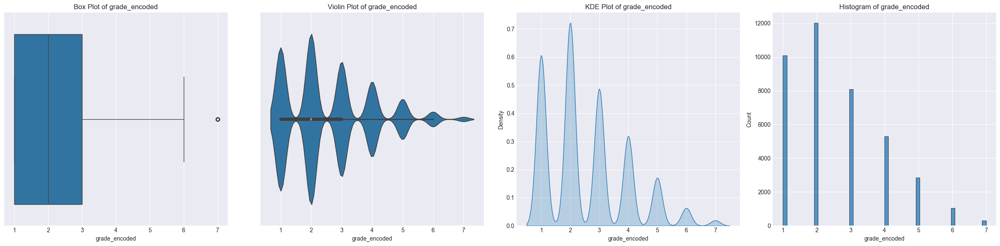

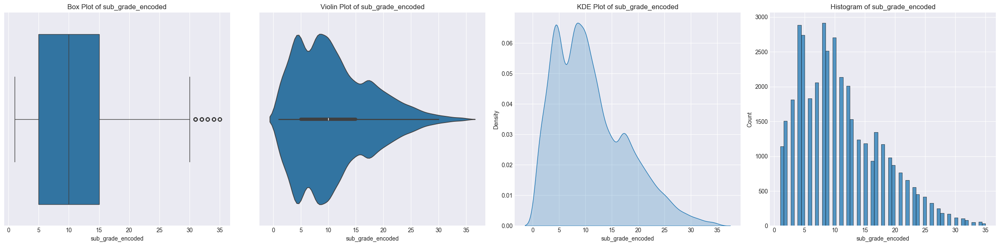

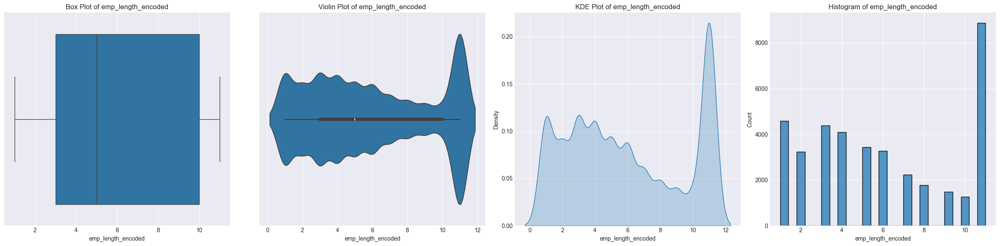

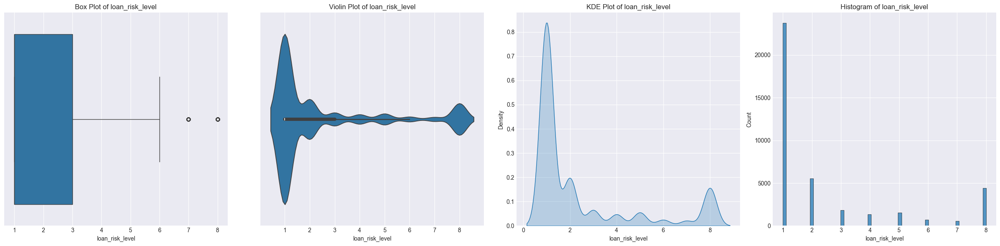

In [28]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_univariate_analysis(i, column_name, data):
    plt.figure(figsize=(24, 6))
    
    plt.subplot(1, 4, 1)
    sns.boxplot(x=data[column_name])
    plt.title(f'Box Plot of {column_name}')
    
    plt.subplot(1, 4, 2)
    sns.violinplot(x=data[column_name])
    plt.title(f'Violin Plot of {column_name}')
    
    plt.subplot(1, 4, 3)
    sns.kdeplot(data[column_name], fill=True)
    plt.title(f'KDE Plot of {column_name}')
    
    plt.subplot(1, 4, 4)
    sns.histplot(data[column_name], kde=False)
    plt.title(f'Histogram of {column_name}')
    
    plt.tight_layout()
    # plt.savefig(f'{i:02}.Univariate_{column_name}.png')
    plt.show()

for i, v in enumerate(numerical_cols, start=1):
    plot_univariate_analysis(i, v, loan_data)


##### Summary for Univariate analysis of Numerical variables

The `loan_amnt` variable reveals that most loan amounts are between $5,000 and $15,000, with a median around $10,000. Density is highest around $10,000, indicating it is a common loan amount. The KDE plot shows peak densities at $5,000 and $10,000, and the Histogram confirms these are frequently requested amounts. Outliers extend up to $35,000 but are less common. Overall, loans are typically requested in the $5,000 to $15,000 range, with a notable preference for $10,000.

The `funded_amnt` variable shows a similar pattern to the `loan_amnt`, with most funded amounts between $5,000 and $15,000 and a median around $10,000. High density around $10,000 indicates it is a common value. The KDE plot displays peak densities at $5,000 and $10,000, and the Histogram confirms these are frequently funded amounts. Outliers up to $35,000 are present but less common. Overall, funded amounts typically range from $5,000 to $15,000, with a notable concentration around $10,000, indicating alignment between requested and funded amounts.

The `funded_amnt_inv` variable shows that the majority of investment amounts are between $5,000 and $15,000, as indicated by the Box Plot.

The `int_rate` variable shows that most loans have interest rates between 7.5% and 15%, with a median around 12.5%. There is a high density of loans with interest rates around 10% to 15%, indicating these are common rates. The KDE plot shows peaks in density around these values, and the Histogram confirms their frequency. Outliers with interest rates up to 25% are present but less common. Overall, the majority of loans have interest rates ranging from 7.5% to 15%, with a significant concentration around 10% to 15%.

The `installment` variable shows that most monthly payments are between $150 and $400, with a median around $300. High density around these values indicates they are common payment amounts. The KDE plot shows peak densities between $150 and $400, and the Histogram confirms their frequency. Outliers with installments extending beyond $1,200 are present but less common. Overall, typical loan installments range from $150 to $400, with a significant concentration around $300.

The `annual_inc` variable indicates that most borrowers have annual incomes clustered tightly at the lower end, with a few extreme outliers reaching up to $6,000,000. The majority of the income data is densely packed at the lower end, indicating a highly skewed distribution. The KDE plot shows a sharp peak near the lower end, and the Histogram confirms that most borrowers report relatively low annual incomes, with a few extremely high incomes skewing the distribution. Overall, while the majority of borrowers have modest annual incomes, a few borrowers have significantly higher incomes, resulting in a highly skewed distribution.

The `dti` variable shows that most borrowers have a debt-to-income ratio between 10 and 20, with a median around 15. There is a high density of DTI values around this range, indicating these are common ratios among borrowers. The KDE plot shows a peak density around 15, and the Histogram confirms that DTIs between 10 and 20 are the most frequent. Overall, typical DTIs for borrowers range from 10 to 20, with a significant concentration around 15.

The `delinq_2yrs` variable shows that most borrowers have very few delinquencies, typically between 0 and 1, with a median of 0. There is a high density of values at 0, indicating the majority of borrowers have no delinquencies. The KDE plot shows a sharp peak at 0, and the Histogram confirms that most borrowers have had no delinquencies in the past two years. Overall, the vast majority of borrowers have a clean or nearly clean delinquency record over the past two years, with only a small number having up to 10 delinquencies.

The `open_acc` variable shows that most borrowers have between 5 and 15 open credit lines, with a median around 10. There is a high density of open accounts in this range, as indicated by the Violin Plot. The KDE plot shows a peak density around 10, and the Histogram confirms that having 5 to 15 open accounts is common. Overall, the typical number of open accounts ranges from 5 to 15, reflecting common borrowing behavior.

The `revol_bal` variable shows that most revolving balances are between $0 and $20,000, with a high density of values below $10,000. The KDE plot shows a sharp peak at lower values, and the Histogram confirms that revolving balances are generally low, with fewer borrowers having balances above $20,000. Overall, most borrowers have revolving balances below $20,000, indicating conservative use of revolving credit.

The `revol_util` variable shows that most borrowers have revolving line utilization rates between 30% and 80%, with a median around 50%. High density within this range indicates common values. The KDE plot shows a relatively uniform distribution with a slight peak around 50%, and the Histogram confirms a broad distribution with significant counts across the entire range from 0% to 100%. Overall, borrowers commonly use about 30% to 80% of their available revolving credit, reflecting diverse credit utilization behaviors.

The `total_acc` variable shows that most borrowers have between 10 and 30 total credit accounts, with a median around 20. High density within this range is confirmed by the Violin Plot. The KDE plot shows peak density around 20, and the Histogram confirms that having 10 to 30 accounts is common. Overall, borrowers typically have a total of 10 to 30 credit accounts, reflecting a range of credit histories.

The `pub_rec_bankruptcies` variable shows that the majority of borrowers have no bankruptcies on record, indicated by the high density at 0 in the Box Plot and Violin Plot. The KDE plot and Histogram confirm that most borrowers have 0 bankruptcies, with very few having 1 or 2 bankruptcies. Overall, nearly all borrowers have no history of bankruptcies, with only a small minority having up to 2 bankruptcies.

The `issue_d_month` variable shows a relatively uniform distribution across all months, with slightly higher counts towards the end of the year (as indicated by the Histogram). The Box Plot confirms a balanced spread across months, and the Violin Plot shows consistent density throughout the year. The KDE plot supports this uniform distribution. Overall, loans are issued consistently throughout the year, with a slight increase towards the end of the year.

The `issue_d_year` variable shows a noticeable increase in loan issuances over time, with a significant spike in 2011 (as seen in the Histogram and KDE plot). The Box Plot confirms a concentration of loan issuances around 2010 and 2011. The Violin Plot shows higher density for these years as well. Overall, there is a clear upward trend in loan issuances, peaking in 2011.

The `credit_history_age_years` variable shows that most borrowers have a credit history age between 0 and 30 years, with a median around 14 years. High density within this range is confirmed by the Violin Plot, and the KDE plot shows a peak around 14 years. The Histogram confirms that most values cluster between 10 and 20 years, with fewer borrowers having longer credit histories. Overall, borrowers typically have credit history ages ranging from 0 to 30 years, reflecting a diverse range of credit experience.

The `installment_to_income_ratio` variable shows that most borrowers have a ratio between 0 and 10, with a median around 5. High density within this range is confirmed by the Violin Plot, and the KDE plot shows a peak around 5. The Histogram shows that values tend to cluster around 5, with fewer borrowers having higher ratios. Overall, borrowers typically have an installment to income ratio between 0 and 10, indicating manageable installment payments relative to their income.

The `investor_funding_ratio` variable shows that the vast majority of loans have a funding ratio close to 100%. This is confirmed by the Box Plot and Violin Plot, as well as the sharp peak at 100% in the KDE plot and Histogram. Overall, nearly all loans are fully funded by investors, indicating high investor confidence and engagement.

The `grade_encoded` variable, shows most loans fall within grades A, B, and C, peaking at A and B (as seen in the KDE plot and Histogram). The Box Plot and Violin Plot confirm this concentration in higher-quality loans.

The `sub_grade_encoded` variable, shows most sub-grades are concentrated between A1 and C5, with high density around these values, as indicated by the KDE plot and Histogram. The Box Plot and Violin Plot reflect this distribution.

Overall, most loans are assigned grades A, B, and C, with finer classification within these grades reflected in sub-grades A1 to C5, indicating higher-quality loans.

The `emp_length_encoded` variable shows a relatively uniform distribution across most employment lengths, with a significant peak at 10+ years, as indicated by the KDE plot and Histogram. The Box Plot confirms a wide range with no extreme outliers, and the Violin Plot highlights consistent density with a notable increase at the highest value.

Overall, while borrowers have varied employment lengths, a significant portion has 10+ years of employment, indicating stable employment among many borrowers.

The `loan_status_encoded` variable shows that the majority of loans are fully paid (encoded as 3), with a smaller portion currently active (encoded as 1), and a very small number charged off (encoded as 2). The Box Plot and Violin Plot highlight the high density of fully paid loans. The KDE plot confirms a significant peak at fully paid loans, and the Histogram shows a large count of fully paid loans, followed by current and charged off loans. Overall, most loans are fully paid, reflecting good repayment behavior among borrowers.

The `loan_risk_level` variable shows that the majority of loans are for less risky purposes like debt consolidation and credit cards, which are encoded as 1. The Box Plot indicates a median at 2, and the Violin Plot highlights a high density around values for debt consolidation and credit cards. The KDE Plot shows a sharp peak for debt consolidation and credit cards, and the Histogram confirms that these are the most common loan purposes, with significant counts for home improvement, major purchase, and small business. Overall, the distribution suggests that many loans are for purposes like debt consolidation and credit cards, with fewer loans for higher-risk purposes like medical, moving, and other.

###  Categorical data

##### Cross tabs

In [29]:
def categorical_summary(d):
    summary = {}
    total_records = len(d)
    
    for column in d.select_dtypes(include=['category', 'object', 'int', 'float']):
        value_counts = d[column].value_counts(dropna=False).reset_index()
        value_counts.columns = [column, 'count']
        value_counts['percentage_total'] = (value_counts['count'] / total_records) * 100
        value_counts['percentage_total'] = value_counts['percentage_total'].round(0)
        non_nan_count = d[column].dropna().count()
        value_counts['percentage_excl_nan'] = (value_counts['count'] / non_nan_count) * 100 if non_nan_count != 0 else 0
        value_counts['percentage_excl_nan'] = value_counts['percentage_excl_nan'].round(0)
        summary[column] = value_counts
        print ()
        print ()
        print (tabulate(summary[column].T, headers="firstrow", tablefmt='github'))
    # return summary

# We do not want to do this for call columns
c = [
    'term', 'emp_length', 'home_ownership', 
    'verification_status', 'loan_status', 'purpose', 'addr_state', 
    'bankruptcy_category', 'income_band', 'interest_rate_level'
]

categorical_summary(loan_data[c])



| term                |   36 months |   60 months |
|---------------------|-------------|-------------|
| count               |       29096 |       10621 |
| percentage_total    |          73 |          27 |
| percentage_excl_nan |          73 |          27 |


| emp_length          |   10+ years |   < 1 year |   2 years |   3 years |   4 years |   5 years |   1 year |   6 years |   7 years |   8 years |   9 years |   nan |
|---------------------|-------------|------------|-----------|-----------|-----------|-----------|----------|-----------|-----------|-----------|-----------|-------|
| count               |        8879 |       4583 |      4388 |      4095 |      3436 |      3282 |     3240 |      2229 |      1773 |      1479 |      1258 |  1075 |
| percentage_total    |          22 |         12 |        11 |        10 |         9 |         8 |        8 |         6 |         4 |         4 |         3 |     3 |
| percentage_excl_nan |          23 |         12 |        11 |        11

##### Some plots - though not needed here 

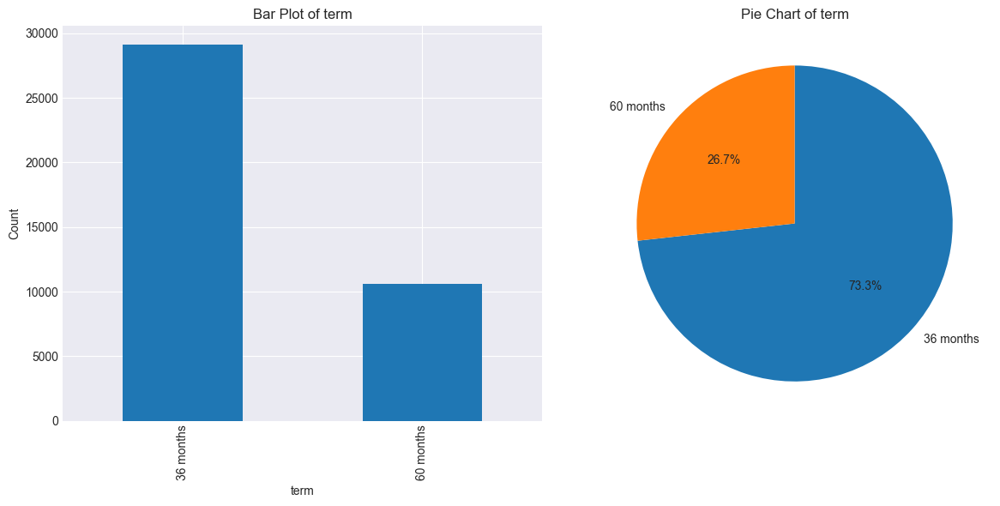

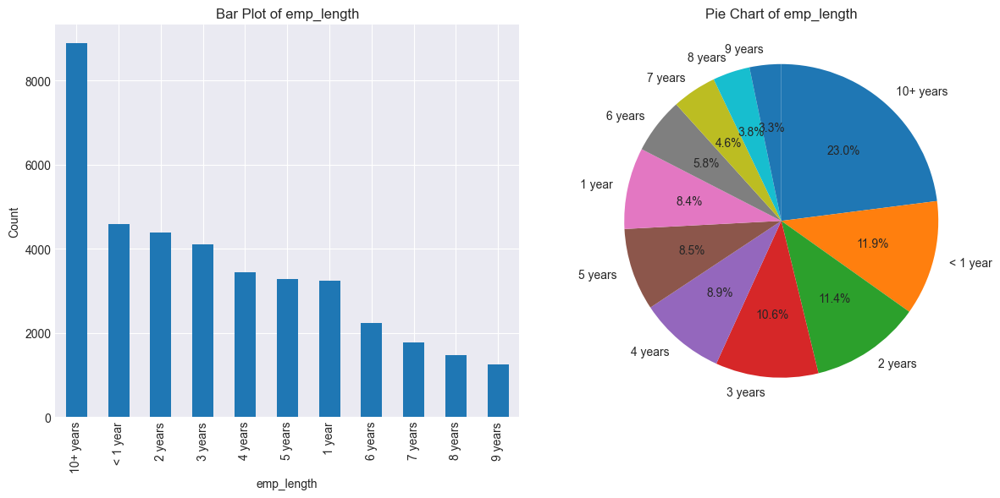

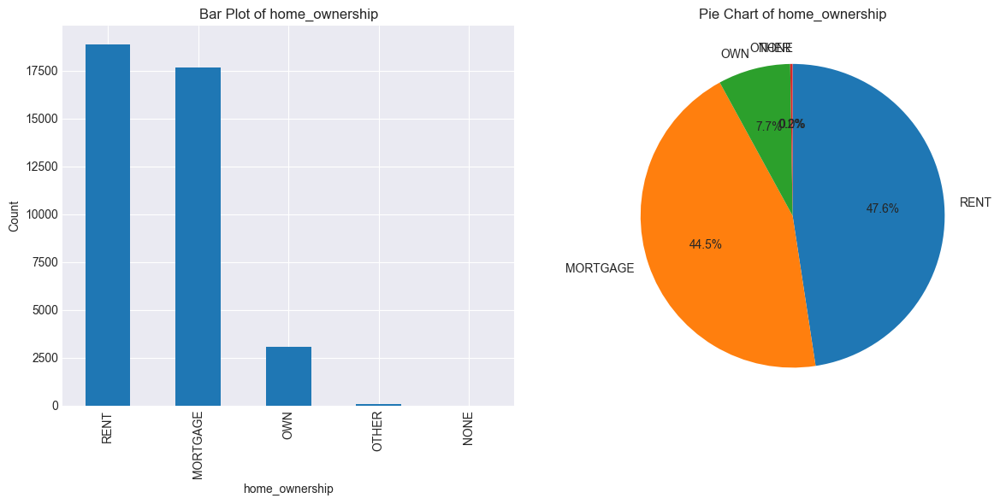

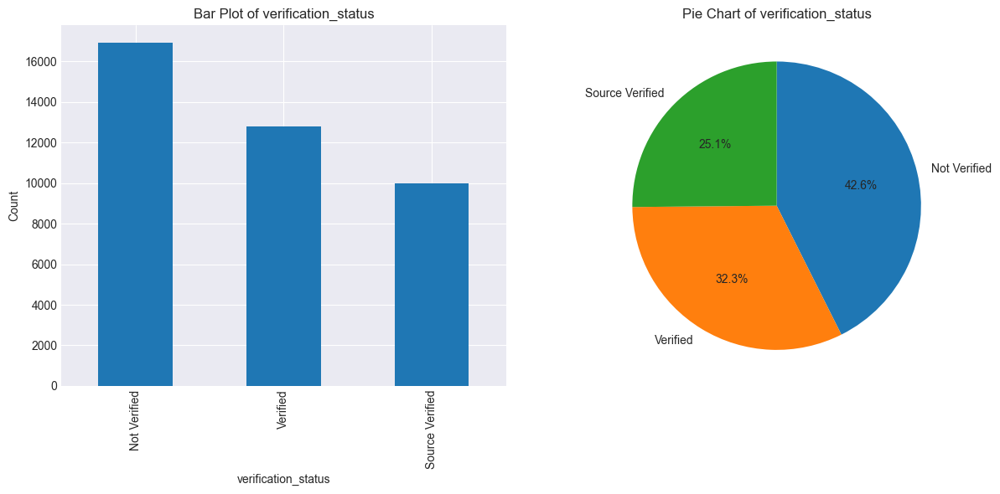

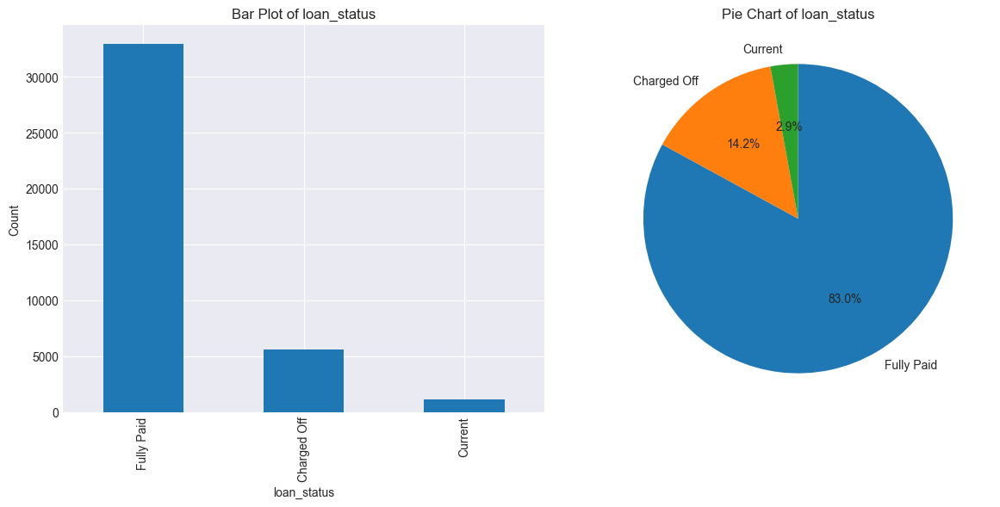

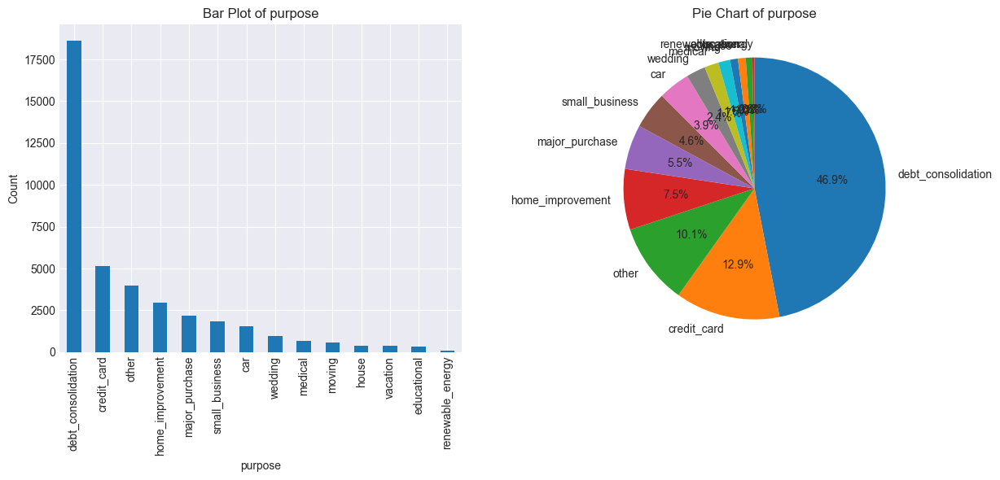

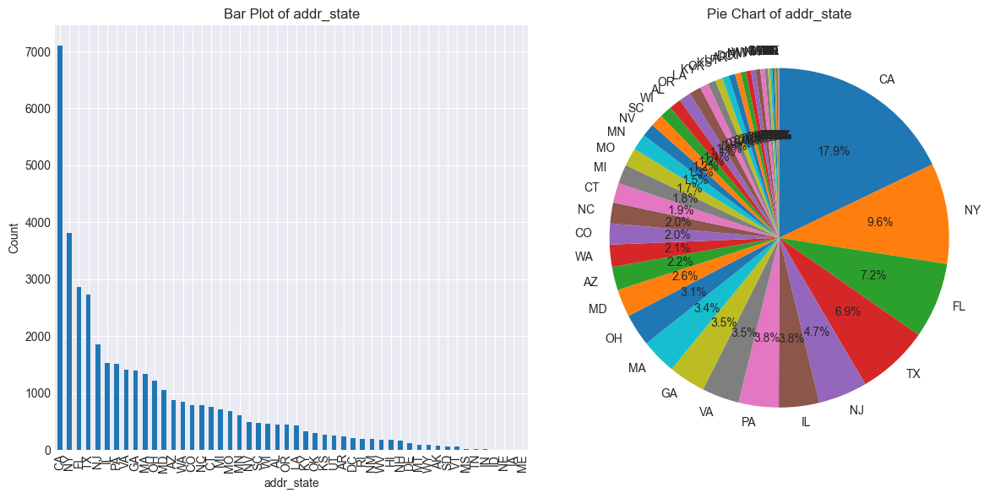

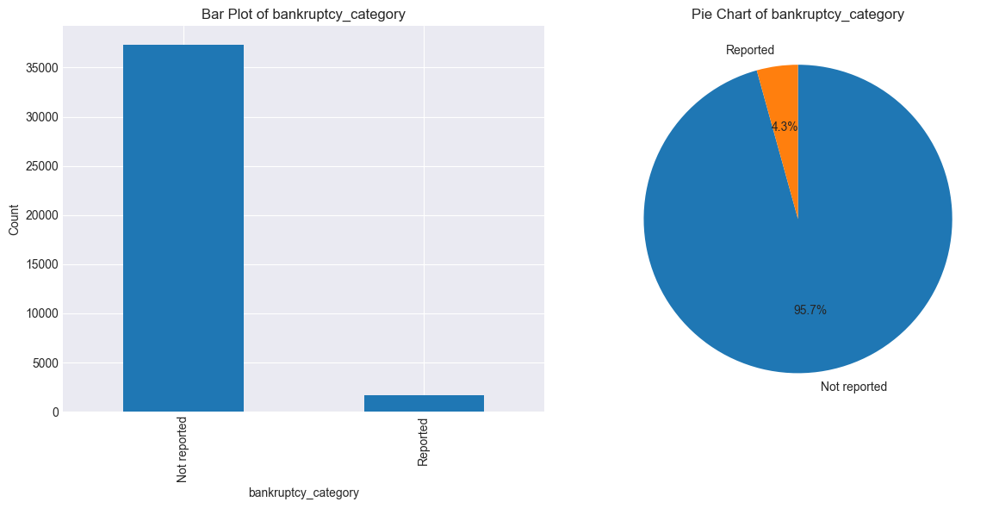

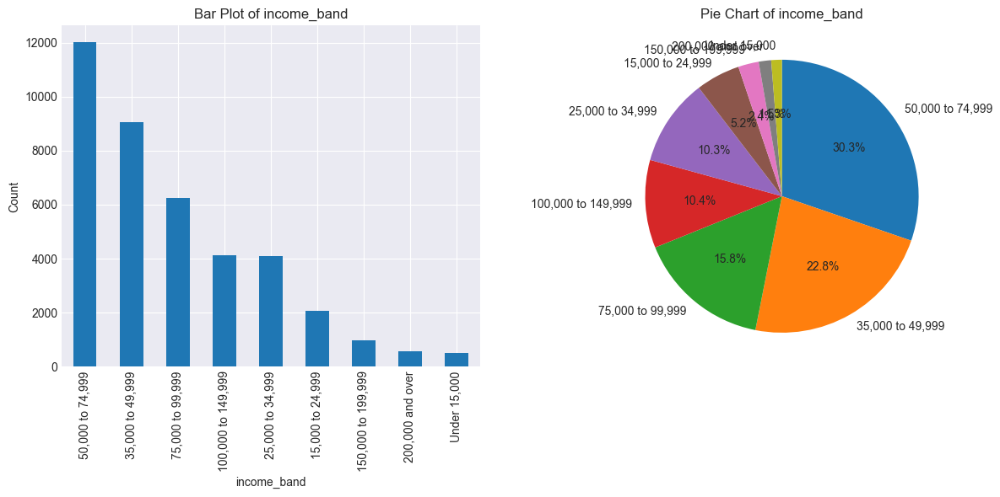

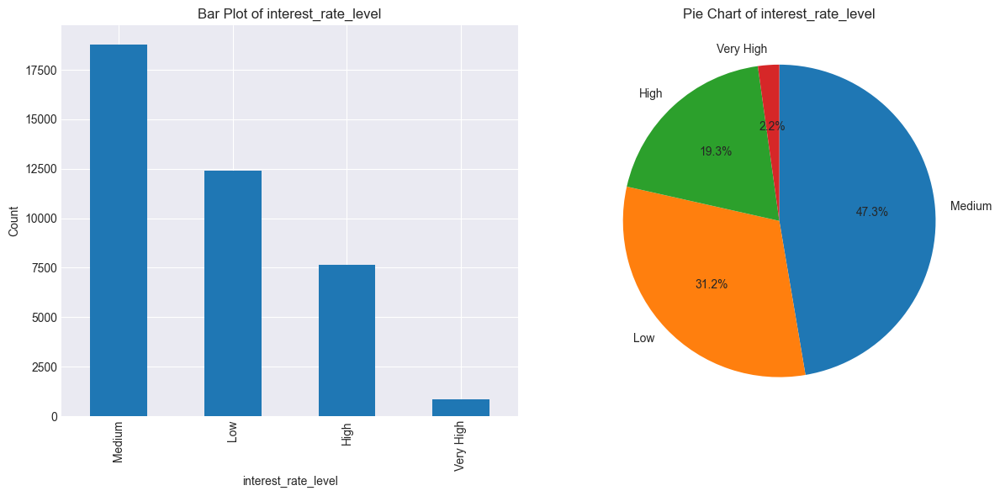

In [30]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_categorical_univariate(data, column):
    plt.figure(figsize=(18, 6))
    
    # Bar Plot
    plt.subplot(1, 3, 1)
    data[column].value_counts().plot(kind='bar')
    plt.title(f'Bar Plot of {column}')
    plt.xlabel(column)
    plt.ylabel('Count')
    
    # Pie Chart
    plt.subplot(1, 3, 2)
    data[column].value_counts().plot(kind='pie', autopct='%1.1f%%', startangle=90, counterclock=False)
    plt.title(f'Pie Chart of {column}')
    plt.ylabel('')
    
    plt.tight_layout()
    plt.show()

c = [
    'term', 'emp_length', 'home_ownership', 
    'verification_status', 'loan_status', 'purpose', 'addr_state', 
    'bankruptcy_category', 'income_band', 'interest_rate_level'
]

for v in c:
    plot_categorical_univariate(loan_data, v)


##### Summary for Univariate analysis of Categorical variables

`term` - Most loans have a term of 36 months (73%), with the remaining 27% having a term of 60 months.

`home_ownership` - Most borrowers either rent (48%) or have a mortgage (44%), with a smaller portion owning their home (8%).

`verification_status` - Verification status is distributed with 43% not verified, 32% verified, and 25% source verified.

`purpose` - Debt consolidation is the most common purpose (47%), followed by credit card (13%) and other (10%). Same data is also summarized as `loan_risk_level` earlier

`addr_state` - Most loans (18%) are from single state `CA` i.e. `State of California`          

Rest of the `variables` are summarized in detail earlier.

# Outlier detection and handling

In [ ]:
# Outlier detection and reporting goes here

In [ ]:
# Outlier removal goes here

# Bivariate analysis 

###  Correlation matrix

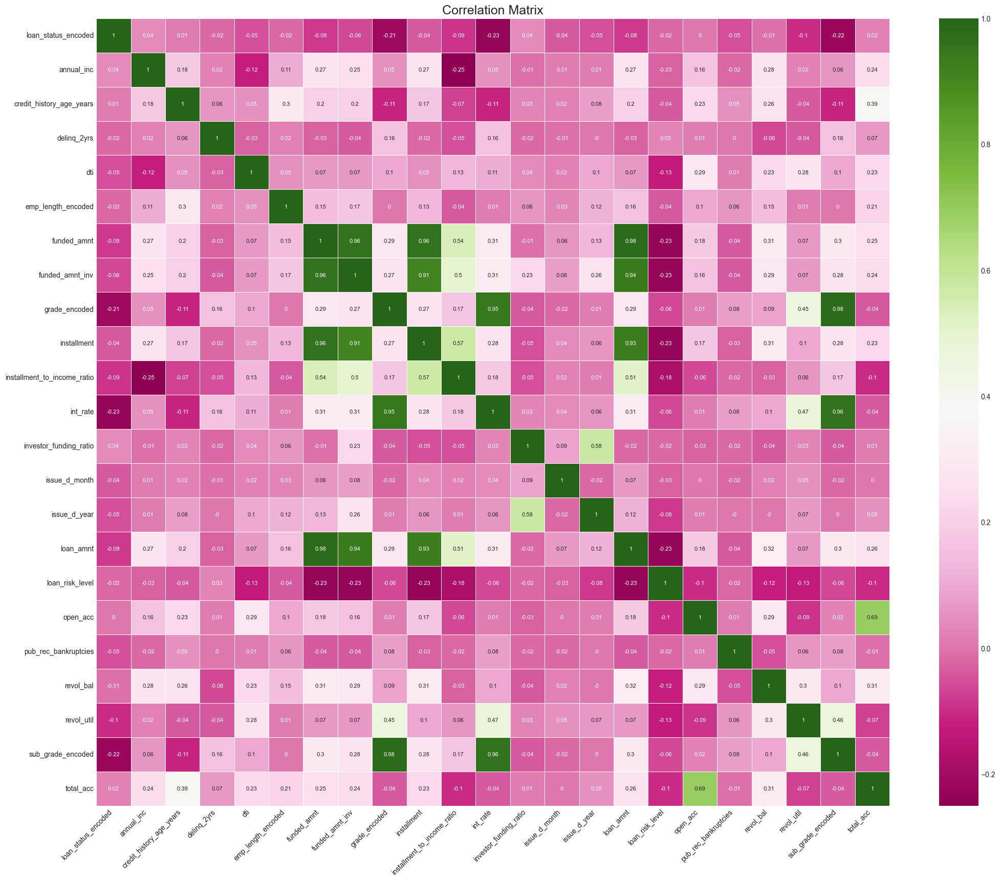

In [31]:
sorted_columns = ['loan_status_encoded'] + sorted(
    [
        col for col in loan_data[numerical_cols].columns if (col != 'loan_status_encoded' and not col.startswith('state'))
        ]
    )

# Calculate the correlation matrix
correlation_matrix = loan_data[sorted_columns].corr().round(2)
correlation_matrix.to_excel('correlation_matrix.xlsx')

# Plot the heatmap with an increased figure size
plt.figure(figsize=(25, 20))
sns.heatmap(correlation_matrix, annot=True, cmap='PiYG', linewidths=0.5, annot_kws={"size": 8})
plt.title('Correlation Matrix', fontsize=18)
plt.xticks(rotation=45, ha='right', fontsize=10)
plt.yticks(fontsize=10)
plt.savefig('correlation_matrix1.png', bbox_inches='tight')
plt.show()

### Following is **NOT MY CODE** but does show clustering nicely

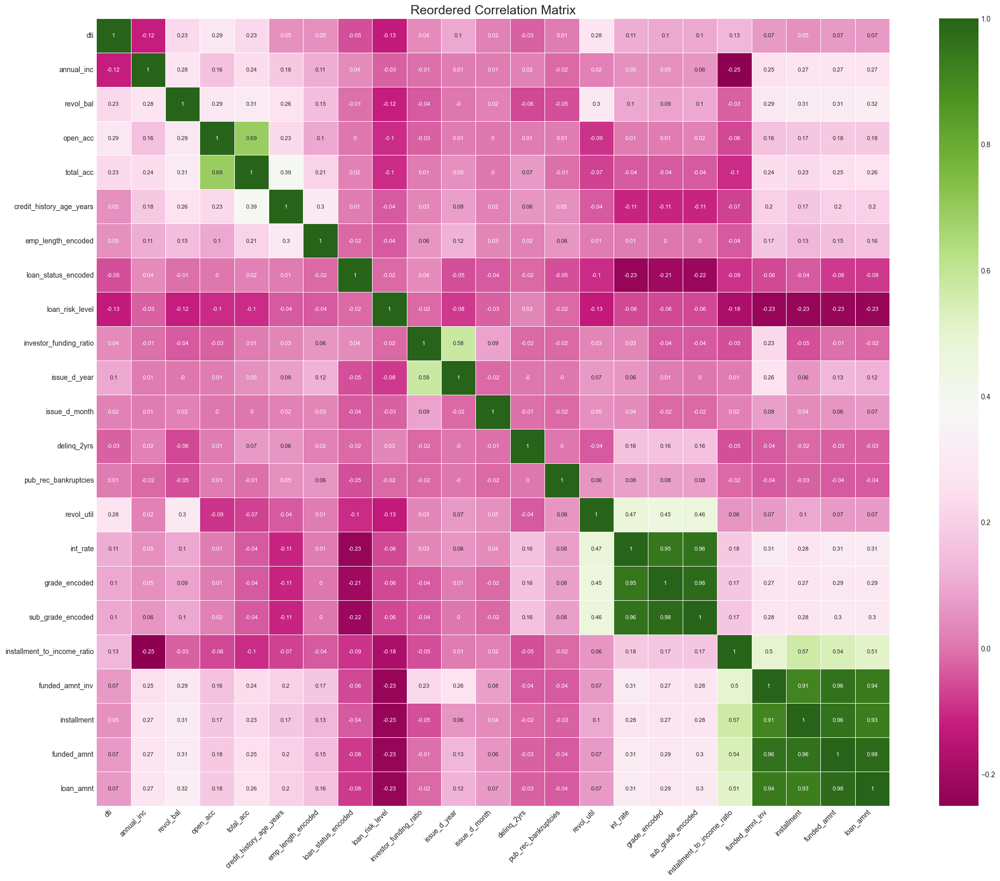

In [32]:
from scipy.cluster.hierarchy import linkage, dendrogram

# Define the sorted columns list excluding 'loan_status_encoded' and 'state'
sorted_columns = ['loan_status_encoded'] + sorted(
    [
        col for col in loan_data[numerical_cols].columns if (col != 'loan_status_encoded' and not col.startswith('state'))
    ]
)

# Calculate the correlation matrix
correlation_matrix = loan_data[sorted_columns].corr().round(2)

# Use hierarchical clustering to reorder the columns based on correlations
linkage_matrix = linkage(correlation_matrix, method='average')
dendro = dendrogram(linkage_matrix, labels=correlation_matrix.columns, no_plot=True)
reordered_columns = dendro['ivl']

# Reorder the correlation matrix
reordered_correlation_matrix = correlation_matrix.loc[reordered_columns, reordered_columns]

# Save the reordered correlation matrix to an Excel file
reordered_correlation_matrix.to_excel('reordered_correlation_matrix.xlsx')

# Plot the heatmap with an increased figure size
plt.figure(figsize=(25, 20))
sns.heatmap(reordered_correlation_matrix, annot=True, cmap='PiYG', linewidths=0.5, annot_kws={"size": 8})
plt.title('Reordered Correlation Matrix', fontsize=18)
plt.xticks(rotation=45, ha='right', fontsize=10)
plt.yticks(fontsize=10)
plt.savefig('reordered_correlation_matrix.png', bbox_inches='tight')
plt.show()

### Cross tabs v/s loan_status

In [33]:
categorical_cols

['term',
 'grade',
 'sub_grade',
 'emp_length',
 'home_ownership',
 'verification_status',
 'loan_status',
 'purpose',
 'addr_state',
 'bankruptcy_category',
 'income_band',
 'interest_rate_level']

In [34]:
def cross_tabulate_categorical(d, catvar):
    cross_tabs = {}
    for var in catvar:
        cross_tab = pd.crosstab(d[var], d['loan_status'], margins=True, normalize='index') * 100
        cross_tab = cross_tab.round(2)        
        # print (tabulate(cross_tab, tablefmt='github'))
        print ()
        print ()
        print ()
        print (cross_tab)

        # cross_tabs[var] = cross_tab
    # return cross_tabs


cross_tabulate_categorical(loan_data, categorical_cols)





loan_status  Charged Off  Current  Fully Paid
term                                         
36 months          11.09     0.00       88.91
60 months          22.60    10.73       66.67
All                14.17     2.87       82.96



loan_status  Charged Off  Current  Fully Paid
grade                                        
A                   5.97     0.40       93.63
B                  11.86     2.87       85.27
C                  16.63     3.26       80.11
D                  21.07     4.18       74.75
E                  25.16     6.30       68.54
F                  30.41     6.96       62.63
G                  31.96     5.38       62.66
All                14.17     2.87       82.96



loan_status  Charged Off  Current  Fully Paid
sub_grade                                    
A1                  2.63     0.00       97.37
A2                  4.91     0.00       95.09
A3                  5.69     0.00       94.31
A4                  6.17     0.45       93.38
A5                  7.91 

### Scatter plots and pair plots

12 columns

['term',
 'grade',
 'sub_grade',
 'emp_length',
 'home_ownership',
 'verification_status',
 'loan_status',
 'purpose',
 'addr_state',
 'bankruptcy_category',
 'income_band',
 'interest_rate_level']

23 columns

['loan_amnt',
 'funded_amnt',
 'funded_amnt_inv',
 'int_rate',
 'installment',
 'annual_inc',
 'dti',
 'delinq_2yrs',
 'open_acc',
 'revol_bal',
 'revol_util',
 'total_acc',
 'pub_rec_bankruptcies',
 'issue_d_month',
 'issue_d_year',
 'credit_history_age_years',
 'installment_to_income_ratio',
 'investor_funding_ratio',
 'loan_status_encoded',
 'grade_encoded',
 'sub_grade_encoded',
 'emp_length_encoded',
 'loan_risk_level']

We do not really need to see `loan_status` = `Current` at this point and it has been excluded. Still not dropping from main data frame `loan_data`

Here is what we have understood after few iterations.

| Variable                      | Correlation | Description                                                                                  |
|-------------------------------|-------------|----------------------------------------------------------------------------------------------|
| Interest Rate (`int_rate`)    | -0.25       | Higher interest rates are associated with a higher likelihood of loans being charged off.     |
| Loan Grade (`grade_encoded`)  | 0.37        | Lower loan grades (higher encoded values) are more likely to be charged off.                  |
| Loan Risk Level (`loan_risk_level`) | 0.32  | Higher loan risk levels are associated with higher chances of loans being charged off.        |
| Debt-to-Income Ratio (`dti`)  | -0.16       | Higher DTI ratios are associated with a higher probability of loans being charged off.        |
| Revolving Utilization (`revol_util`) | -0.14 | Higher revolving utilization rates are associated with a higher likelihood of loans being charged off. |
| Annual Income (`annual_inc`)  | 0.14        | Lower annual incomes are associated with a higher likelihood of loans being charged off.      |
| Loan Amount (`loan_amnt`)     | 0.08        | Higher loan amounts have a slight correlation with being charged off.                         |
| Credit History Age (`credit_history_age_years`) | 0.18 | Older credit histories are associated with better loan outcomes.                             |
| Employment Length (`emp_length_encoded`) | 0.13 | Longer employment lengths are associated with better loan outcomes.                          |
| Installment-to-Income Ratio (`installment_to_income_ratio`) | -0.10 | Higher installment-to-income ratios are associated with a higher probability of loans being charged off. |


<Figure size 2000x1600 with 0 Axes>

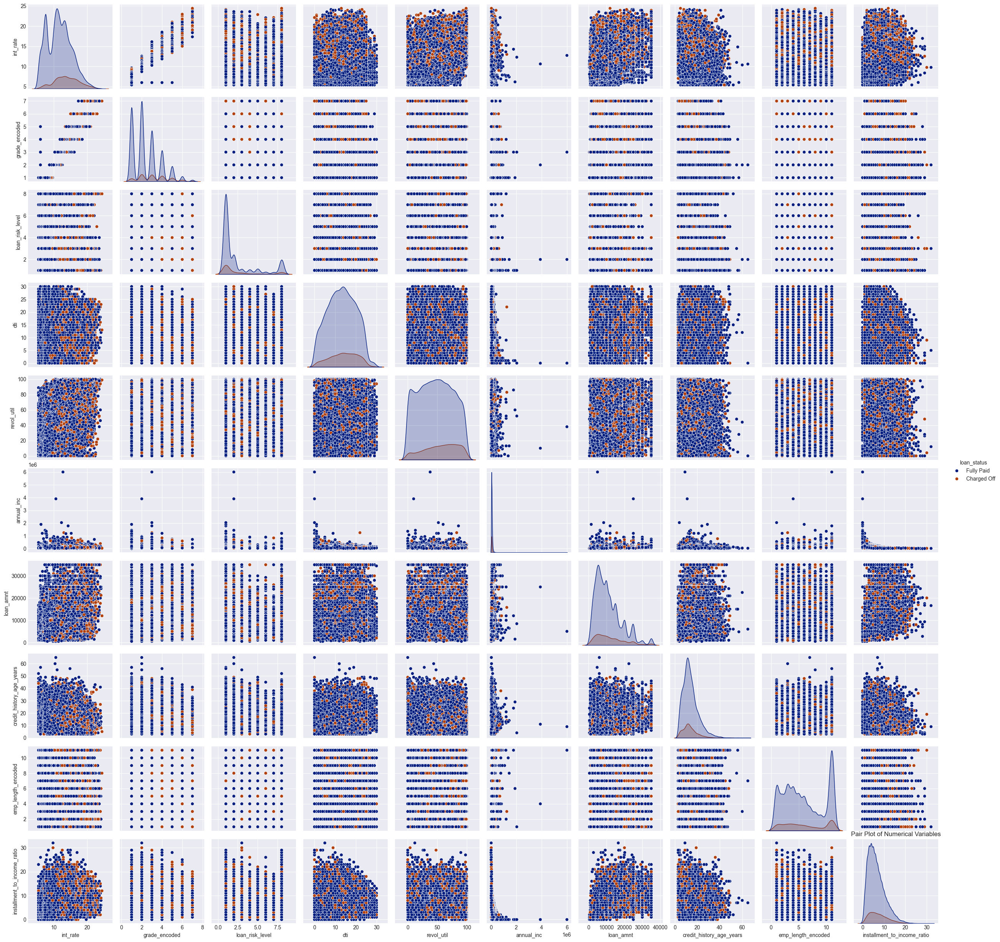

In [35]:
import matplotlib.pyplot as plt
import seaborn as sns

def plot_scatter_and_pair(data, target_col, numerical_cols):
    # for col in numerical_cols:
    #     if col != target_col:
    #         plt.figure(figsize=(12, 10)) 
    #         sns.scatterplot(x=col, y=target_col, data=data)
    #         plt.title(f'Scatter Plot of {col} vs {target_col}')
    #         plt.xlabel(col)
    #         plt.ylabel(target_col)
    #         plt.show()
    
    plt.figure(figsize=(20, 16))
    sns.pairplot(
        data[numerical_cols + [target_col]], 
        hue=target_col,
        palette='dark'
        )
    plt.title('Pair Plot of Numerical Variables')
    plt.show()

def plot_box_plots(data, categorical_cols, target_col):
    for column in categorical_cols:
        plt.figure(figsize=(12, 6))
        sns.boxplot(x=column, y=target_col, data=data)
        plt.title(f'Box Plot of {target_col} by {column}')
        plt.xlabel(column)
        plt.ylabel(target_col)
        plt.xticks(rotation=45)
        plt.show()

target_col = 'loan_status'
c = [
    'int_rate',
    'grade_encoded',
    'loan_risk_level',
    'dti',
    'revol_util',
    'annual_inc',
    'loan_amnt',
    'credit_history_age_years',
    'emp_length_encoded',
    'installment_to_income_ratio'
]

# We do not really need to see `Current``
d = loan_data[loan_data['loan_status'] != 'Current'].copy(deep=True)
d['loan_status'] = pd.Categorical(d['loan_status'],
    categories=['Fully Paid', 'Charged Off'],
    ordered=True
)

plot_scatter_and_pair(d, target_col, c)
# plot_box_plots(loan_data[loan_data['loan_status'] != 'Current'], categorical_cols, target_col)

### Conclusion from Scatter/pair plots

The pair plot shows a comprehensive view of the relationships between various numerical features and the target variable `loan_status` (represented by different colors). To determine the biggest impact on `loan_status`, especially for loans that are charged off, we can analyze some key observations from the chart:

1. **Interest Rate (`int_rate`)**:
    - There is a clear distinction in `int_rate` distributions between `Fully Paid` and `Charged Off` loans. Loans with higher interest rates are more likely to be charged off, indicating that a higher interest rate might be a significant risk factor.

2. **Debt-to-Income Ratio (`dti`)**:
    - There is some separation visible in `dti` between `Fully Paid` and `Charged Off` loans, though it is not as pronounced as `int_rate`. Higher `dti` values slightly tend to be associated with charged-off loans, suggesting that higher debt-to-income ratios could be a contributing factor to loan defaults.

3. **Annual Income (`annual_inc`)**:
    - There is a slight trend where lower annual incomes are more associated with `Charged Off` loans. This suggests that borrowers with lower incomes might have a higher risk of defaulting.

4. **Loan Amount (`loan_amnt`)**:
    - The `loan_amnt` does not show a very strong separation between `Fully Paid` and `Charged Off` loans. However, it might still play a role in conjunction with other factors.

5. **Credit History Age (`credit_history_age_years`)**:
    - The age of credit history shows some separation where younger credit histories (fewer years) might be more associated with `Charged Off` loans. This suggests that less established credit histories could contribute to higher risk.

6. **Employment Length (`emp_length_encoded`)**:
    - There seems to be a pattern where shorter employment lengths are slightly more associated with `Charged Off` loans, suggesting that job stability might impact loan repayment ability.

7. **Installment to Income Ratio (`installment_to_income_ratio`)**:
    - This ratio does not show a strong separation, indicating that it might not be as significant a factor on its own.

8. **Grade (`grade_encoded`)**:
    - The loan grade shows a notable pattern where lower grades (which are higher risk) are more associated with `Charged Off` loans. This reinforces the idea that loan grades are a strong indicator of risk.

Overall, the features that seem to have the biggest impact on the likelihood of a loan being charged off are:

1. **Interest Rate (`int_rate`)**: Higher rates are strongly associated with charged-off loans.
2. **Grade (`grade_encoded`)**: Lower grades correlate with higher risk.
3. **Debt-to-Income Ratio (`dti`)**: Higher ratios are slightly more associated with defaults.
4. **Annual Income (`annual_inc`)**: Lower incomes show a higher risk of default.
5. **Credit History Age (`credit_history_age_years`)**: Shorter credit histories are more prone to defaults.

These observations suggest that loan defaults are more likely for borrowers with higher interest rates, lower loan grades, higher debt-to-income ratios, lower annual incomes, and shorter credit histories.

# TODO

In [36]:
import plotly.express as px
d = loan_data.dropna(subset=['emp_length_encoded'], inplace=False).copy(deep=True)

fig = px.scatter_3d(d, 
                    x='income_band', 
                    y='dti', 
                    z='int_rate', 
                    color='credit_history_age_years', 
                    size='emp_length_encoded', 
                    title='3D Scatter plot of Interest Rate')
fig.show()
